### Análisis de Componentes Principales usando Descomposición de valores singulares

In [1]:
using Images
using LinearAlgebra
using Plots

Paso 1: Cargar y convertir la imagen a escala de grises
En este paso, cargamos una imagen desde el disco usando la función load() de la librería Images. Luego, convertimos la imagen a escala de grises con Gray.(img) para simplificar el proceso de descomposición. Al trabajar con imágenes en escala de grises, la matriz de la imagen contendrá valores entre 0 (negro) y 1 (blanco).

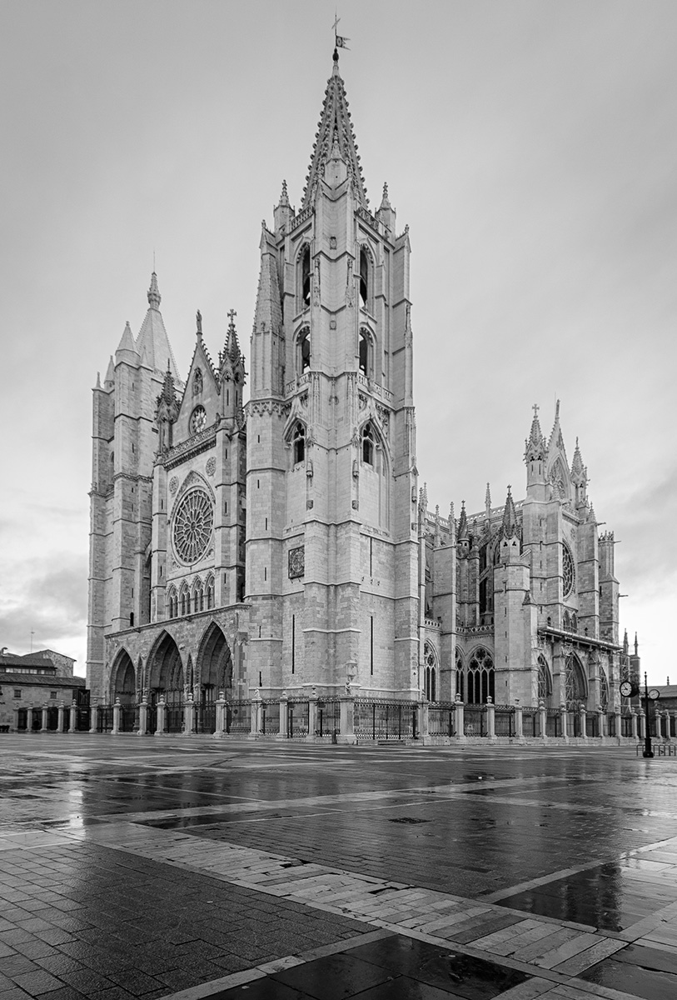

In [2]:
# Paso 1: Cargar y convertir la imagen a escala de grises
function load_image(filepath)
    img = load(filepath)  # Cargar imagen desde archivo
    return Gray.(img)     # Convertir a escala de grises
end

# Cargar una imagen (ajusta la ruta a una imagen en tu sistema)
img = load_image("catedral-gotica.jpg")

Paso 2: Convertir la imagen a una matriz de píxeles.
Convertimos la imagen a una matriz de números flotantes (Float64) para poder realizar operaciones matemáticas. Cada valor en la matriz representa la intensidad de un píxel en la imagen.

In [3]:
?heatmap

search: heatmap heatmap! plots_heatmap plots_heatmap! hmaxima! floatmax



```
heatmap(x,y,z)
heatmap!(x,y,z)
```

Plot a heatmap of the rectangular array `z`.

# Keyword arguments

  * `aspect_ratio::Union{Real, Symbol}`: Plot area is resized so                  that 1 y-unit is the same size as                  `aspect_ratio` x-units. With `:none`, images inherit                  aspect ratio of the plot area. Use `:equal` for                  unit aspect ratio. Aliases: (:aspect*ratios,                  :aspectratio, :aspectratios, :axis*ratio, :axisratio,                  :ratio).

# Example

```julia-repl
julia> heatmap(randn(10,10))
```


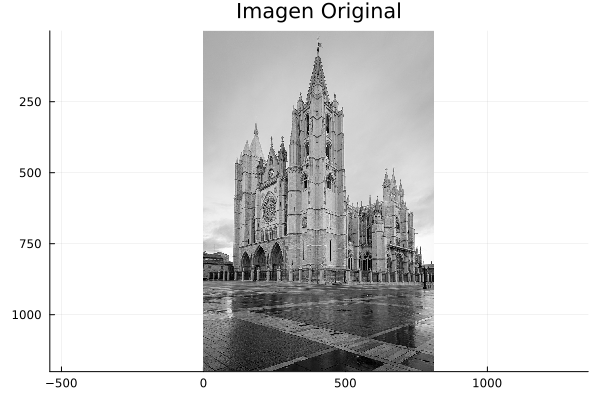

In [4]:
# Paso 2: Convertir la imagen a una matriz de píxeles (Float64)
img_matrix = float(img)  # Convertir los valores de la imagen a números flotantes (escala de grises)

# Mostrar la imagen original
plot(heatmap(img_matrix, color=:gray), title="Imagen Original", legend=false)
display(plot(heatmap(img_matrix, color=:gray), title="Imagen Original", legend=false))  # Mostrar la imagen original

Paso 3: Aplicar la descomposición en valores singulares (SVD). Utilizamos la SVD sobre la matriz de la imagen. Esta descomposición descompone la matriz de la imagen X en tres matrices:

U: Matriz que contiene las "direcciones" principales en las filas.

S: Vector que contiene los valores singulares, los cuales representan la "importancia" de cada componente principal.

Vt: Matriz que contiene las "direcciones" principales en las columnas.

Imprimimos algunos de los valores singulares para ver la importancia relativa de los primeros componentes principales.

In [5]:
# Paso 3: Aplicar SVD (Descomposición en valores singulares)
# Descomposición de la imagen: X = U * S * V^T
F = svd(img_matrix)

# Mostrar información sobre los valores singulares
 println("Número de componentes principales:", length(F.S))
 println("Valores singulares (primeros 10):", F.S[1:end])

Número de componentes principales:813
Valores singulares (primeros 10):Float32[603.03546, 72.68076, 50.32371, 37.93884, 31.02652, 25.978577, 23.819271, 20.948177, 18.97377, 18.525257, 17.879206, 16.624445, 16.033257, 15.116224, 14.922479, 13.541523, 12.613079, 12.187947, 11.6068945, 11.433265, 10.977844, 10.443726, 10.17689, 9.979523, 9.892946, 9.5291195, 9.168665, 8.877448, 8.801138, 8.625496, 8.51423, 8.291696, 8.097483, 7.9379907, 7.7852, 7.7214074, 7.665371, 7.584871, 7.4270563, 7.309478, 7.254117, 7.132759, 7.0696325, 6.936372, 6.9100513, 6.8379397, 6.682572, 6.6491175, 6.5811734, 6.5574174, 6.4694505, 6.3104057, 6.3072696, 6.257442, 6.2084227, 6.1541257, 6.087198, 6.035736, 5.956722, 5.9414806, 5.8972206, 5.767728, 5.7482486, 5.6846557, 5.652995, 5.64984, 5.596781, 5.5173197, 5.471109, 5.460332, 5.414562, 5.3245683, 5.2751284, 5.2546215, 5.2041864, 5.1172905, 5.1020384, 5.083672, 5.059984, 5.0075235, 4.946811, 4.922152, 4.8983965, 4.858255, 4.831242, 4.772558, 4.7367806, 4.676797

In [6]:
typeof(img_matrix[1])

Gray{Float32}

In [7]:
img_matrix[1]

In [8]:
?Gray

search: Gray GrayA AGray gray Gray24 Array AGray32 wrap try



`Gray` is a grayscale object. You can extract its value with `gray(c)`.


In [9]:
g=gray(img_matrix[1])

0.6745098f0

In [10]:
typeof(g)

Float32

In [11]:
Gray(g)

In [12]:
gray.(img_matrix)

1200×813 Matrix{Float32}:
 0.67451   0.670588  0.670588  0.670588  …  0.709804  0.709804  0.709804
 0.67451   0.670588  0.666667  0.670588     0.705882  0.705882  0.705882
 0.666667  0.662745  0.662745  0.666667     0.713726  0.709804  0.709804
 0.666667  0.662745  0.662745  0.670588     0.713726  0.713726  0.713726
 0.67451   0.670588  0.670588  0.670588     0.709804  0.709804  0.709804
 0.666667  0.666667  0.666667  0.666667  …  0.709804  0.709804  0.709804
 0.662745  0.662745  0.662745  0.666667     0.709804  0.713726  0.713726
 0.670588  0.666667  0.666667  0.670588     0.705882  0.709804  0.709804
 0.666667  0.666667  0.670588  0.666667     0.713726  0.709804  0.709804
 0.662745  0.666667  0.666667  0.666667     0.713726  0.709804  0.709804
 0.666667  0.666667  0.666667  0.666667  …  0.713726  0.709804  0.709804
 0.67451   0.670588  0.670588  0.666667     0.713726  0.709804  0.709804
 0.67451   0.670588  0.670588  0.666667     0.713726  0.709804  0.709804
 ⋮                       

In [13]:
img_matrix ≈ F.U * Diagonal(F.S) * F.Vt

true

In [14]:
u=F.U
s=F.S
v=F.Vt

813×813 Matrix{Float32}:
 -0.0381895    -0.0382767    -0.0382983    …  -0.0411654   -0.0412587
  0.0340847     0.0347784     0.0345367        0.069688     0.0697283
 -0.0483719    -0.047228     -0.0461862       -0.00647053  -0.00646553
 -0.0367517    -0.0351853    -0.0349969        0.011688     0.0109004
  0.0546351     0.0533908     0.0543627       -0.0669481   -0.064534
  0.00850804    0.0103832     0.0116217    …   0.0135122    0.0149941
 -0.0120591    -0.00919764   -0.000969013     -0.0324731   -0.0353435
  0.0293549     0.0279594     0.0225354        0.0309635    0.0342268
  0.0196697     0.023009      0.0254321       -0.0255605   -0.0252235
 -0.023951     -0.0230233    -0.0325709       -0.0277191   -0.0255141
  0.000654381   0.00170409    0.00277442   …  -0.0149667   -0.0150218
 -0.00175188    0.0031907     0.0110607        0.00347056   0.000921215
  0.00616327    0.00650364    0.0020046        0.0451299    0.043977
  ⋮                                        ⋱               
  0.

Paso 4: Función para reconstruir la imagen
La función reconstruir_imagen() toma las matrices 
  obtenidas de la SVD y utiliza solo los primeros num_componentes componentes principales para reconstruir la imagen. Cuantos más componentes se utilicen, más información se mantendrá en la imagen reconstruida, por lo que la imagen se verá más detallada.

In [15]:
# Paso 4: Función para reconstruir la imagen usando un número limitado de componentes principales
function reconstruir_imagen(u, s, v, num_componentes)
    # Usar las primeras num_componentes componentes
    U_reducido = u[:, 1:num_componentes]
    S_reducido = Diagonal(s[1:num_componentes])
    Vt_reducido = v[1:num_componentes, :]
    # Reconstrucción de la imagen
    return Gray.(U_reducido * S_reducido * Vt_reducido)
end

reconstruir_imagen (generic function with 1 method)

Paso 5: Reconstrucción y visualización de imágenes
Reconstruimos la imagen utilizando diferentes cantidades de componentes principales (5, 15, 45, 135, 813) y mostramos los resultados. A medida que usamos más componentes, la imagen reconstruida se parece más a la original.

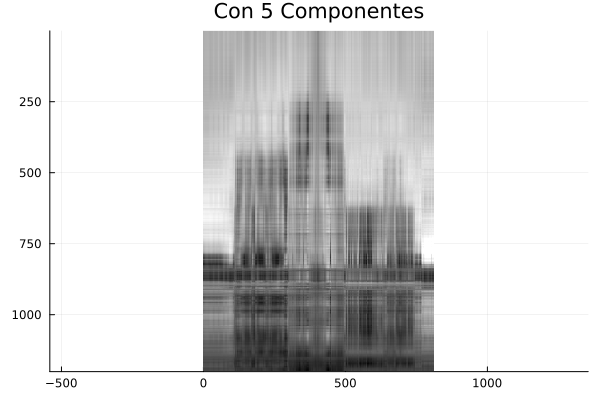

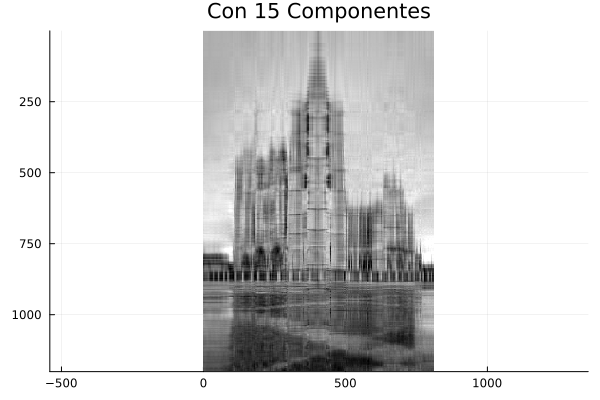

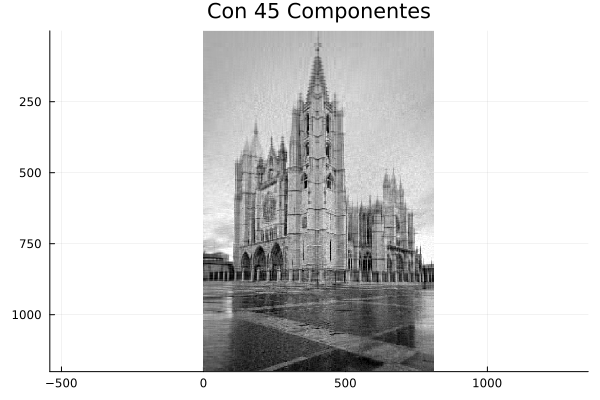

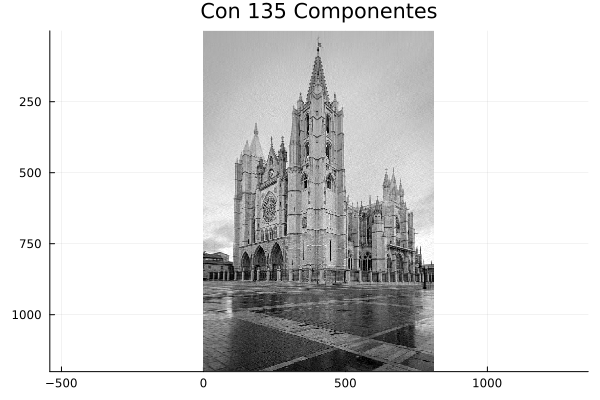

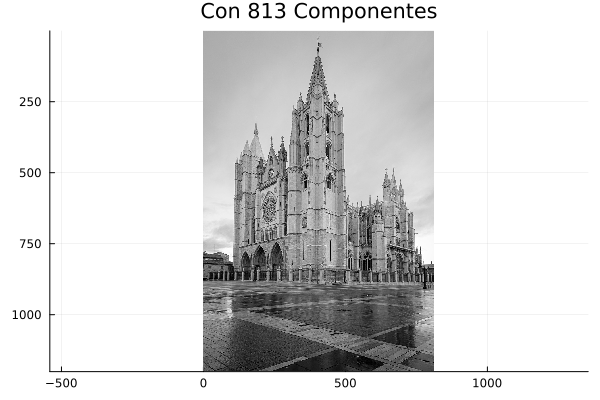

In [16]:
img_reconstruida = reconstruir_imagen(u, s, v, 5)
a=plot(heatmap(img_reconstruida, color=:gray), title="Con 5 Componentes", legend=false)
display(a)

img_reconstruida = reconstruir_imagen(u, s, v, 15)
b=plot(heatmap(img_reconstruida, color=:gray), title="Con 15 Componentes", legend=false)
display(b)

img_reconstruida = reconstruir_imagen(u, s, v, 45)
c=plot(heatmap(img_reconstruida, color=:gray), title="Con 45 Componentes", legend=false)
display(c)

img_reconstruida = reconstruir_imagen(u, s, v, 135)
d=plot(heatmap(img_reconstruida, color=:gray), title="Con 135 Componentes", legend=false)
display(d)

img_reconstruida = reconstruir_imagen(u, s, v, 813)
e=plot(heatmap(img_reconstruida, color=:gray), title="Con 813 Componentes", legend=false)
display(e)